# **INITIAL SETUP**

## MODULES

In [183]:
import math
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import seaborn as sns

## GRAPH STYLE

In [294]:
plt.style.use('dark_background')
plt.rcParams['figure.figsize'] = (25, 5)

sns.set_theme(style="darkgrid")
sns.set(style="ticks", context="talk")

## CONSTANTS

In [185]:
PATH = "2021.1.21" # Currently using JAN21 Data

C = {              # DATA CHANNELS NAMING
    1: "ACC_X",    # CH1 - ACC_X
    2: "ACC_Y",    # CH2 - ACC_Y
    3: "ACC_Z",    # CH3 - ACC_Z
    4: "AUDIO"     # CH4 - AUDIO
}

COLOR = {          # GRAPHS COLORING
    1: "#ffa500",  # Compaction 1 - Orange
    2: "#eeee00",  # Compaction 2 - Yellow
    3: "#00cc00",  # Compaction 3 - Green
    4: "#ffffff",  # Compaction 4 - White
    5: "#cc00aa",  # Compaction 5 - Magenta
    6: "#aa0000"   # Compaction 6 - Red
}

In [186]:
# FMAX = 639.99

---

# **DATA MANIPULATION FUNCTIONS**

## FFT

Computer the Fast Fourier Transform

> - Returns the Power Spectral Density

In [187]:
def fft (t, v):
    """ Fast Fourier Transform """
    n = len(t)                                                                                          # Sample size
    dt = np.average(np.diff(t))                                                                         # Sampling gap
    fs = 1/dt                                                                                           # Sampling frequency (fs)
    f = np.arange(n//2) / n / dt                                                                        # Frequency domain frequencies, also => np.fft.fftfreq(n//2, dt)
    v_bar = np.fft.fft(v)                                                                               # Fast Fourier Transform
    v_bar = v_bar[:n//2]                                                                                # Nyquist Shannon Theorem => ∀f > fs/2 !v_bar[f]
    v_bar = np.sqrt(v_bar * np.conj(v_bar)) / n                                                         # Power Spectrum Density
    return f, abs(v_bar)

## WELCH METHOD

``` Estimates filtered (smoothened) Power Spectral Density ```


> - nperseg - increase by power of 2 to increase resolution

In [188]:
def welch(t, v, nperseg=2**13):
    """ Power Spectrum Density estimation using Welch's method """
    dt = np.average(np.diff(t))                                                                         # Sampling gap
    fs = 1/dt                                                                                           # Sampling frequency (fs)
    f, v_bar = signal.welch(v, fs=fs, window='hamming', nperseg=nperseg, noverlap=0)                    # Power Spectrum Density
    return f, abs(v_bar)

## FIND_K

``` Finds the frequency with the maximum amplitude in a given interval ```

In [189]:
def find_k (f, v_bar, k=1):
    """ Finds k frequencies with the maximum amplitude in a given interval """
    k_indices = np.argsort(v_bar)[-k:] # np.argpartition(v_bar, range(len(v_bar)-k, len(v_bar)))[-k:]    
    v_bar_dash = np.zeros(v_bar.size)
    v_bar_dash[k_indices] = v_bar[k_indices]
    if k == 1: return f, v_bar_dash, f[k_indices[-1]]
    else: return f, v_bar_dash, f[k_indices]

## BANDPASS FILTER *(HARD)*

> - Takes frequency domain data pair as input

In [190]:
def bpf(f, v_bar, lth=0, hth=-1):
    """ Bandpass Filter """
    if hth == -1: 
        return f[np.argmax(f>lth):], v_bar[np.argmax(f>lth):]
    else: 
        return f[np.argmax(f>lth):np.argmax(f>hth)], v_bar[np.argmax(f>lth):np.argmax(f>hth)]

## BANDPASS FILTER *(GRADUAL)*

>  - `Using Butterworth second order section`
>  - Takes time domain data pair as input 

In [191]:
def bbpf(t, v, lth=0, hth=-1, order=5):
    """ Butter Bandpass Filter """
    dt = np.average(np.diff(t))                                                                         # Sampling gap
    fs = 1/dt                                                                                           # Sampling frequency (fs)
    nyq = 0.5 * fs                                                                                      # Nyquist frequency = fs/2
    if hth == -1: hth = nyq
    sos = signal.butter(order, [lth / nyq, hth / nyq], analog=False, btype='band', output='sos')        # Cascaded second order sections
    x_filt = signal.sosfiltfilt(sos, v)                                                                 # Forward-backward digital filter
    return t, x_filt

---

# GRAPHING FUNCTIONS

``` The graphs are plotted on a logarithmic scale ```

> - `n` - compaction *(1 to 6)*
> - `c` - data value
>     - 1 - ACC_X
>     - 2 - ACC_Y
>     - 3 - ACC_Z
>     - 4 - AUDIO
> - `lth` - Lower frequency value for the bandpassfilter 
> - `hth` - Higher frequency value for the bandpassfilter
>         - set as -1 to set as maximum
>         - < 640

## graph()

Graph FFT and Welch transforms in the same graph

In [192]:
def graph(n, c=1, lth=25, hth=-1):
    """ Graph FFT and Welch in the same plot """
    t, *v = np.genfromtxt(f'data/{PATH}/CLEANED/{n}.csv', delimiter=',', unpack=True)
    plt.semilogy(*bpf(*fft(t, v[c-1]), lth, hth), color = COLOR[n]) #, label = f"FFT_{n} | {C[c]}")
    plt.semilogy(*bpf(*welch(t, v[c-1]), lth, hth), color = COLOR[n]) #, label = f"WELCH_{n} | {C[c]}")
    plt.title(f"{n} | {C[c]} | {lth} Hz - {hth if hth > 0 else 'MAX'} Hz")
#     plt.legend(loc='best')
    plt.tight_layout()

## wave()

Graph *Wave* data for a given compaction

In [193]:
def wave(n, c=1, lth=25, hth=-1):
    """ Graph the Wave data """
    plt.semilogy(*bpf(*np.genfromtxt(f'data/{PATH}/CLEANED/Wave_{n}{c}.csv', delimiter=',', unpack = True), lth, hth), color = COLOR[n]) #, label = f"WAVE_{n} | {C[c]}")
    plt.title(f"{n} | {C[c]} | {lth} Hz - {hth if hth > 0 else 'MAX'} Hz")
#     plt.legend(loc='best')
    plt.tight_layout()

## compare_graph()

Compare FFT, Welch, and Wave frequency domain data in different graphs

In [194]:
def compare_graph(n, c=1, lth=25, hth=-1):
    """ Compare FFT, Welch, and Wave frequency domain data in different graphs """
    fig, (ax1, ax2, ax3) = plt.subplots(nrows = 3, ncols = 1, sharex = True)
    t, *v = np.genfromtxt(f'data/{PATH}/CLEANED/{n}.csv', delimiter=',', unpack=True)
    ax1.semilogy(*bpf(*fft(t, v[c-1]), lth, hth), color = COLOR[n]) #, label = f"FFT_{n} | {C[c]}")
    ax2.semilogy(*bpf(*welch(t, v[c-1]), lth, hth), color = COLOR[n]) #, label = f"WELCH_{n} | {C[c]}")
    ax3.semilogy(*bpf(*np.genfromtxt(f'data/{PATH}/CLEANED/Wave_{n}{c}.csv', delimiter=',', unpack = True), lth, hth), color = COLOR[n]) #, label = f"WAVE_{n} | {C[c]}")
    plt.title(f"{n} | {C[c]} | {lth} Hz - {hth if hth > 0 else 'MAX'} Hz")
#     plt.legend(loc='best')
    plt.tight_layout()

## listk()

> Plot the highest frequency in the given frequency interval for every compaction
>> - `visual` - Set *False* to omit the graph 
>> - `ft` - Transform method to use
>>     - Set as `fft` to use *FFT*                - more noise, but highest resolution
>>     - Set as `welch` to use *Welch Estimation* - lower noise (set high *nperseg* to improve resolution if required)

``` The function prints the frequencies (and their corresponding compactions) sorted in ascending order ```

In [195]:
def listk(c = 1, lth=25, hth=-1, visual=True, ft = fft):
    data = np.array([None] * 6)
    fk = np.array([None] * 6)
    
    print(f"******************************************************** {C[c]} ********************************************************")
    for n in range(0,6):
        data[n] = np.genfromtxt(f'data/{PATH}/CLEANED/{n+1}.csv', delimiter=',', unpack=True)
        *vb, fk[n] = find_k(*bpf(*ft(data[n][0], data[n][c]), lth, hth))
        if visual: 
            plt.semilogy(*vb, label = f"{n+1}", color = COLOR[n+1])
#             print(f"->> [{n+1}] {fk[n]}") # {', '.join(str(f) for f in fk[n])}

    if visual: 
        plt.title(f"{C[c]} | {lth} Hz - {hth if hth > 0 else 'MAX'} Hz")
        plt.legend(loc='best')
        plt.tight_layout()
#         print(f"-------------------------")
    
    print(f"< > Sorted Frequencies (left to right compactions) - [{', '.join(map(lambda x:(' %5s   '%str(x + 1)), np.argsort(fk)))}]")
    print(f"< > Sorted Frequencies (low to high frequencies)   - [{', '.join(map(lambda x:('%9s'%('%.5f'%x)), fk[np.argsort(fk)]))}]")
    
    return np.argsort(fk)

## `compose()`

> Use this function to experiment 

In [196]:
def compose(c=1, lth=25, hth=-1, visual=True, ft=welch):
    if visual: 
        graph(1, c, lth, hth)
        graph(2, c, lth, hth)
        graph(3, c, lth, hth)
        graph(4, c, lth, hth)
        graph(5, c, lth, hth)
        graph(6, c, lth, hth)

    pat = listk(c, lth, hth, visual, ft)
    return ''.join(map(lambda x:str(x + 1), pat))

---

# **GRAPHS**

Ranges of interest are handpicked based on observations from the graphs. They are written under their component headings.  
Please follow these examples to see how to read them.

> `X6 = [52, 257, 397]` implies that the ranges of interest for `ACC_X` are 
>> - `[52 - 6 , 52 + 6]`   = `[46, 58] Hz`
>> - `[257 - 6 , 257 + 6]` = `[251, 263] Hz`
>> - `[397 - 6 , 397 + 6]` = `[391, 403] Hz`

> `Y3 = [397, 404]` implies that the ranges of interest for `ACC_Y` are 
>> - `[397 - 3 , 397 + 3]` = `[394, 400] Hz`
>> - `[404 - 3 , 404 + 3]` = `[401, 407] Hz`

The following are the frequency domain graphs around the points of interest for each for the data components.

In [197]:
patterns = []

---

## `ACC_X`

******************************************************** ACC_X ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      2   ,      3   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.25000, 396.71875, 396.71875, 396.87500, 397.18750, 398.12500]


'562341'

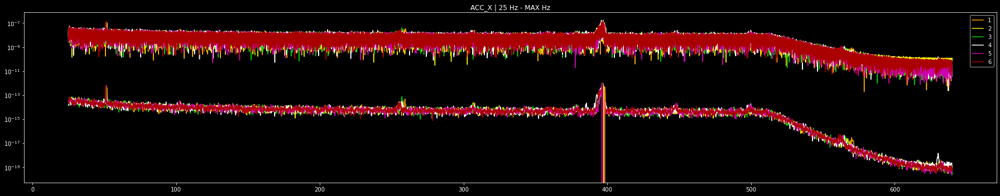

In [198]:
compose(1) # COMPLETE GRAPH

******************************************************** ACC_X ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 50.93750,  51.09375,  51.25000,  51.40625,  51.40625,  51.87500]


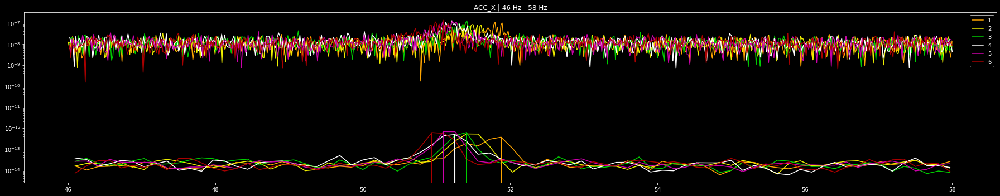

In [199]:
fc = 52
fd = 6
patterns.append(compose(1, fc - fd, fc + fd))

******************************************************** ACC_X ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [255.78125, 255.93750, 256.71875, 257.03125, 257.81250, 259.21875]


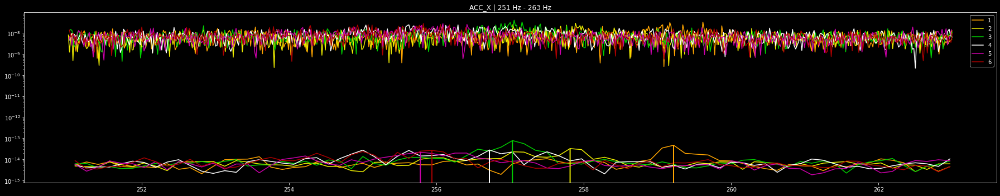

In [200]:
fc = 257
fd = 6
patterns.append(compose(1, fc - fd, fc + fd))

******************************************************** ACC_X ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      2   ,      3   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.25000, 396.71875, 396.71875, 396.87500, 397.18750, 398.12500]


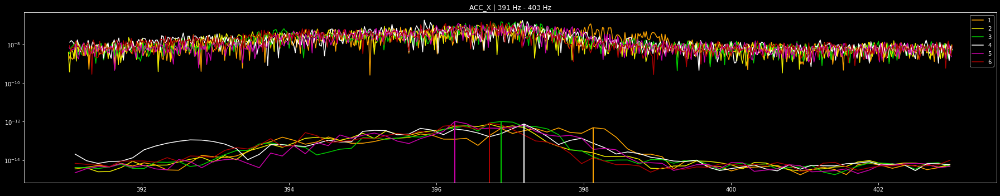

In [201]:
fc = 397
fd = 6
patterns.append(compose(1, fc - fd, fc + fd))

---

## `ACC_Y`

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.25000, 396.25000, 396.87500, 397.03125, 397.18750, 398.12500]


'563241'

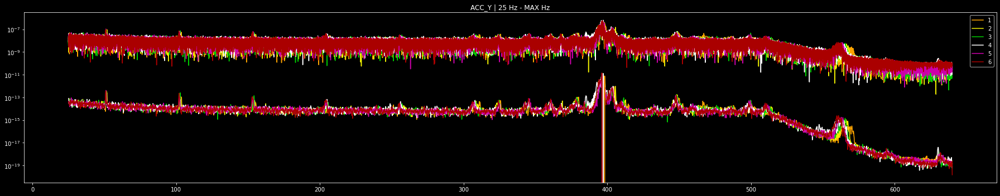

In [202]:
compose(2)  # COMPLETE GRAPH

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 51.09375,  51.09375,  51.25000,  51.40625,  51.56250,  51.87500]


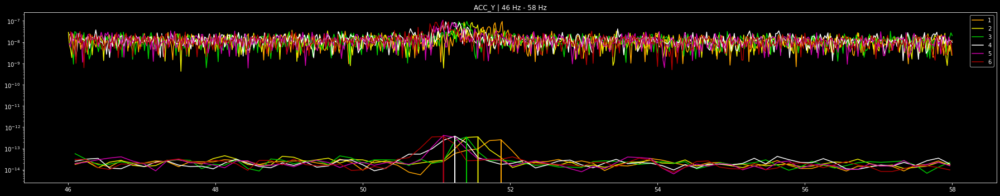

In [203]:
fc = 52
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [102.03125, 102.18750, 102.34375, 102.81250, 103.12500, 103.59375]


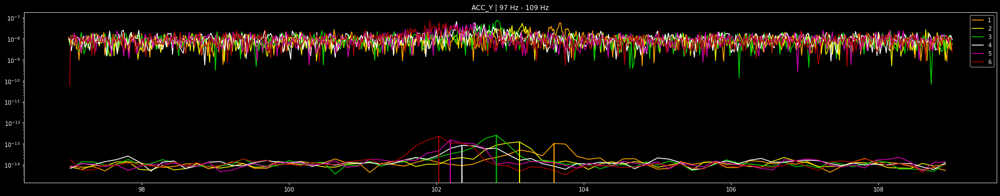

In [204]:
fc = 103
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      4   ,      5   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [153.12500, 153.28125, 153.28125, 154.21875, 154.53125, 155.31250]


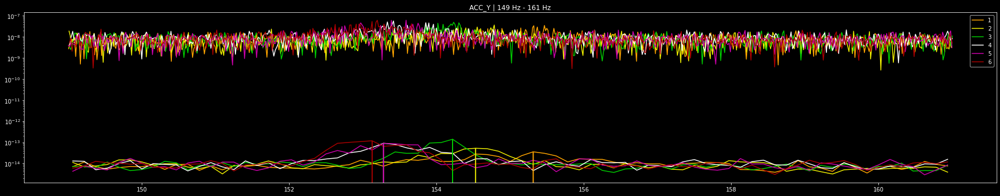

In [205]:
fc = 155
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [204.06250, 204.68750, 205.00000, 205.62500, 205.78125, 205.93750]


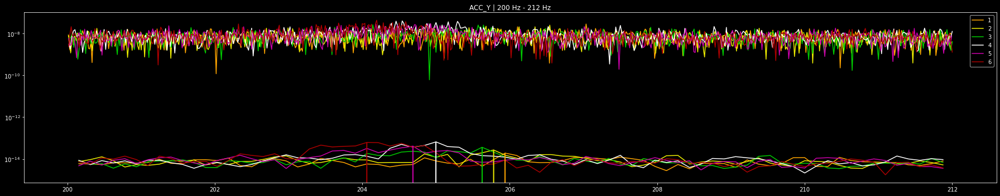

In [206]:
fc = 206
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     1   ,      6   ,      5   ,      2   ,      4   ,      3   ]
< > Sorted Frequencies (low to high frequencies)   - [251.25000, 255.31250, 255.46875, 255.93750, 256.09375, 257.18750]


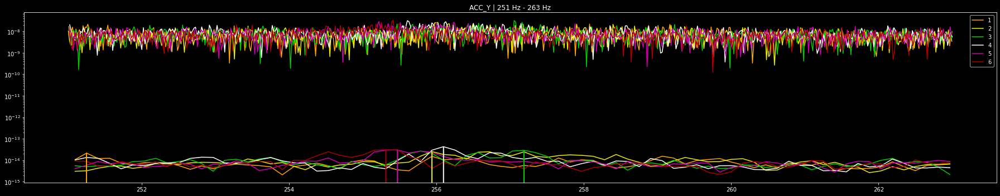

In [207]:
fc = 257
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [306.56250, 307.34375, 307.96875, 308.43750, 308.75000, 310.93750]


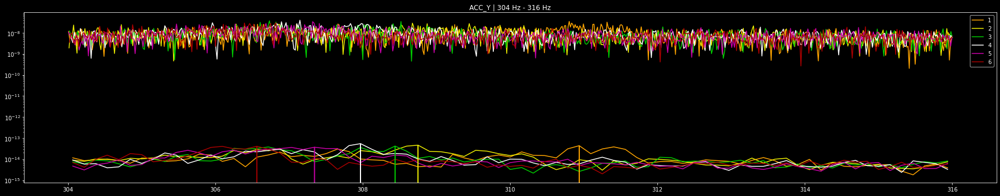

In [208]:
fc = 310
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      2   ,      3   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [324.21875, 324.21875, 324.21875, 324.68750, 324.84375, 325.31250]


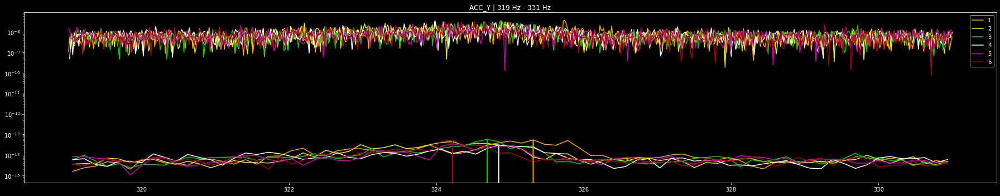

In [209]:
fc = 325
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     4   ,      6   ,      2   ,      5   ,      3   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [359.37500, 360.62500, 360.62500, 360.93750, 361.25000, 362.03125]


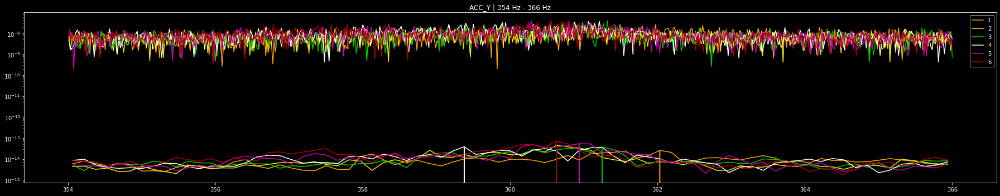

In [210]:
fc = 360
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.25000, 396.25000, 396.87500, 397.03125, 397.18750, 398.12500]


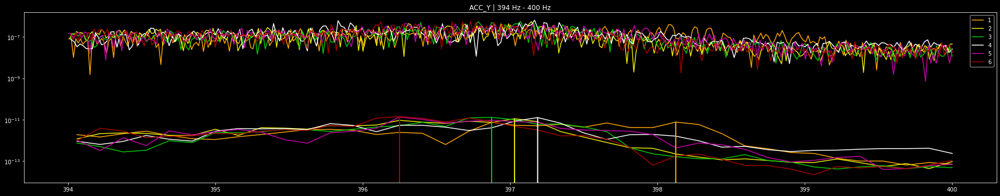

In [211]:
fc = 397
fd = 3
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      3   ,      6   ,      4   ,      1   ,      2   ]
< > Sorted Frequencies (low to high frequencies)   - [403.12500, 403.28125, 403.43750, 403.90625, 404.53125, 405.62500]


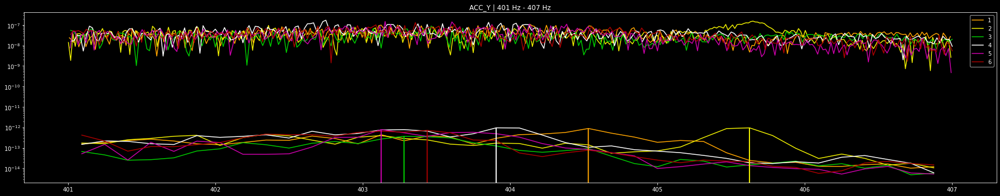

In [212]:
fc = 404
fd = 3
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [447.50000, 447.96875, 448.12500, 448.12500, 448.43750, 449.21875]


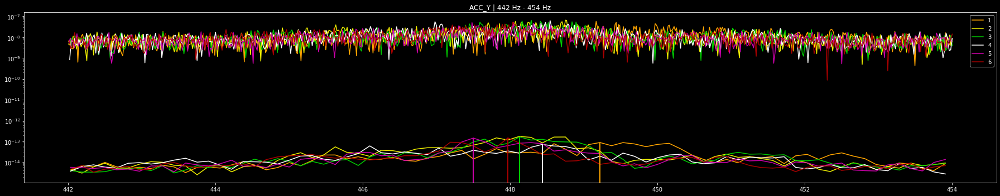

In [213]:
fc = 448
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

******************************************************** ACC_Y ********************************************************
< > Sorted Frequencies (left to right compactions) - [     4   ,      6   ,      3   ,      5   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [497.34375, 498.28125, 499.37500, 499.53125, 500.31250, 500.62500]


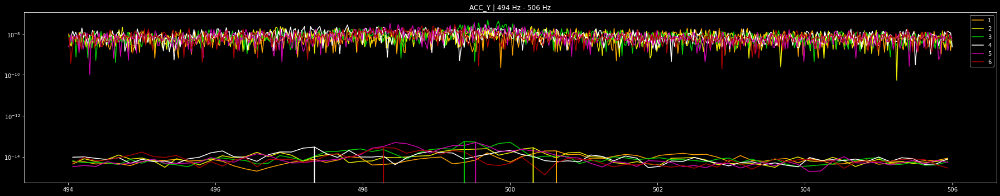

In [214]:
fc = 500
fd = 6
patterns.append(compose(2, fc - fd, fc + fd))

---

## `ACC_Z`

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      4   ,      5   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 50.93750,  51.09375,  51.09375,  51.40625,  51.40625,  51.87500]


'645321'

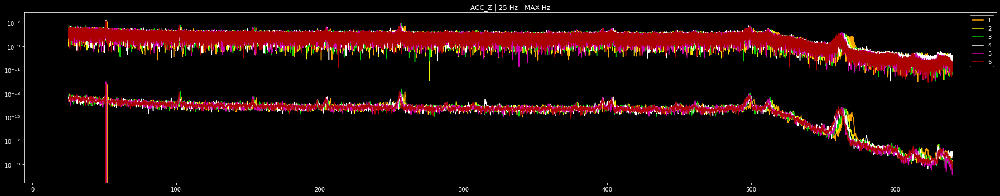

In [215]:
compose(3) # COMPLETE GRAPH

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      4   ,      5   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 50.93750,  51.09375,  51.09375,  51.40625,  51.40625,  51.87500]


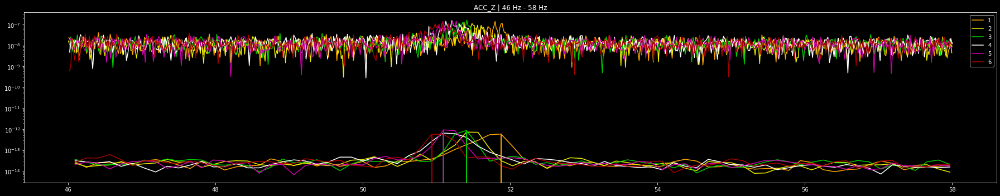

In [216]:
fc = 52
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [102.03125, 102.18750, 102.50000, 102.81250, 103.12500, 103.59375]


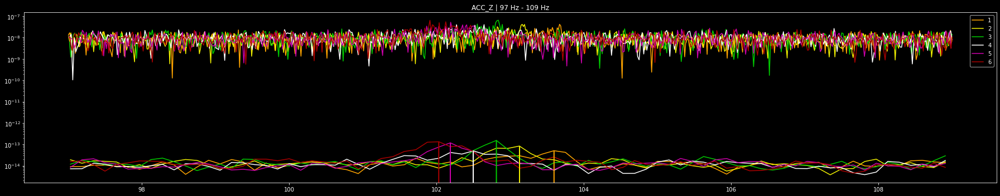

In [217]:
fc = 103
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      4   ,      5   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [153.12500, 153.43750, 153.43750, 154.21875, 154.37500, 155.62500]


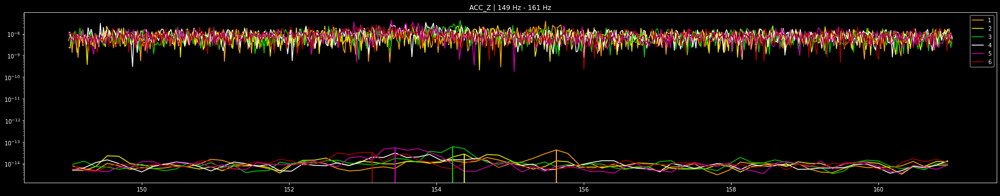

In [218]:
fc = 155
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      4   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [203.75000, 204.21875, 205.15625, 205.31250, 206.25000, 207.34375]


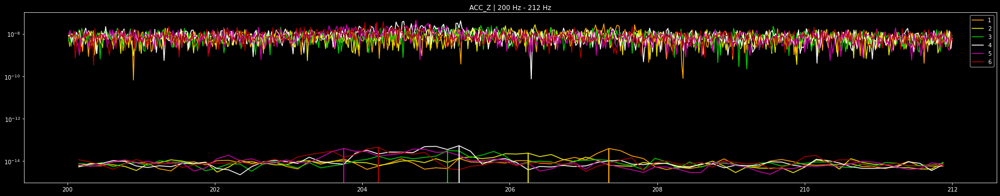

In [219]:
fc = 206
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [255.46875, 256.09375, 256.87500, 257.03125, 257.96875, 259.21875]


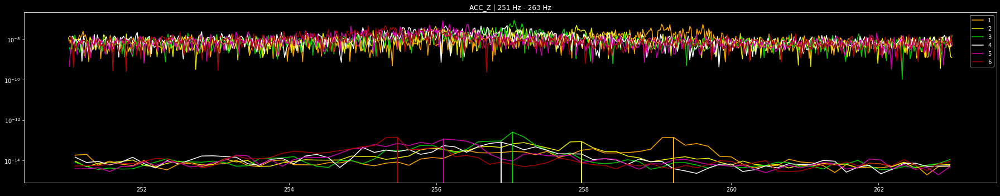

In [220]:
fc = 257
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     1   ,      5   ,      3   ,      6   ,      2   ,      4   ]
< > Sorted Frequencies (low to high frequencies)   - [305.62500, 306.71875, 306.71875, 306.87500, 308.59375, 315.00000]


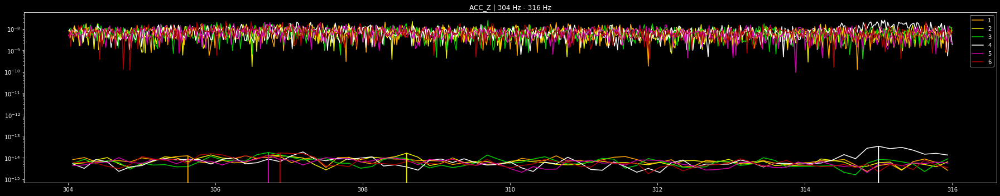

In [221]:
fc = 310
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     2   ,      5   ,      3   ,      6   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [355.15625, 358.90625, 359.21875, 360.15625, 360.46875, 365.62500]


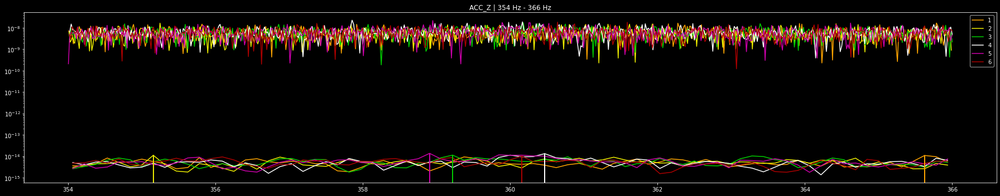

In [222]:
fc = 360
fd = 6
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     3   ,      6   ,      5   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.40625, 396.71875, 396.87500, 397.03125, 397.18750, 397.50000]


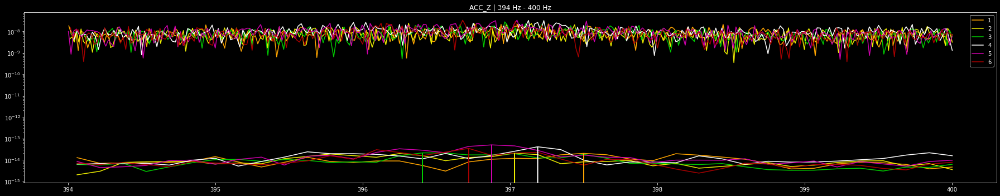

In [223]:
fc = 397
fd = 3
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      3   ,      4   ,      1   ,      2   ]
< > Sorted Frequencies (low to high frequencies)   - [402.96875, 403.12500, 403.90625, 404.06250, 404.53125, 405.46875]


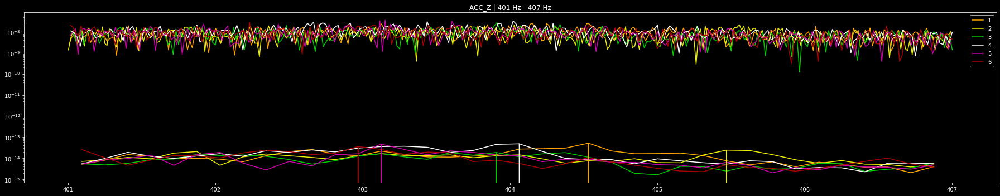

In [224]:
fc = 404
fd = 3
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [447.50000, 447.96875, 448.12500, 448.12500, 448.90625, 449.84375]


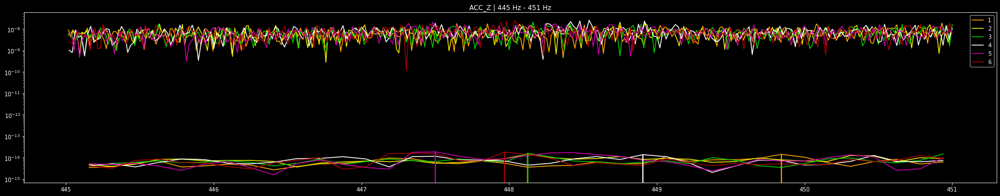

In [225]:
fc = 448
fd = 3
patterns.append(compose(3, fc - fd, fc + fd))

******************************************************** ACC_Z ********************************************************
< > Sorted Frequencies (left to right compactions) - [     4   ,      5   ,      6   ,      2   ,      3   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [498.12500, 498.43750, 499.06250, 499.21875, 499.37500, 502.18750]


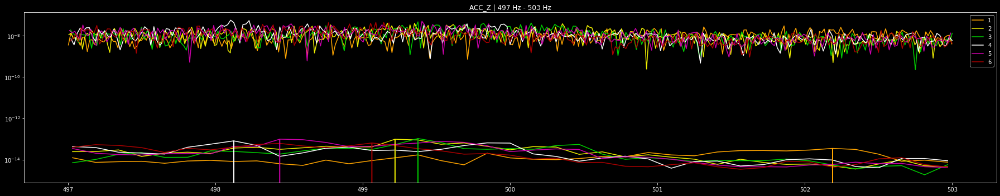

In [226]:
fc = 500
fd = 3
patterns.append(compose(3, fc - fd, fc + fd))

---

## `AUDIO`

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 50.93750,  51.09375,  51.25000,  51.40625,  51.40625,  51.87500]


'654321'

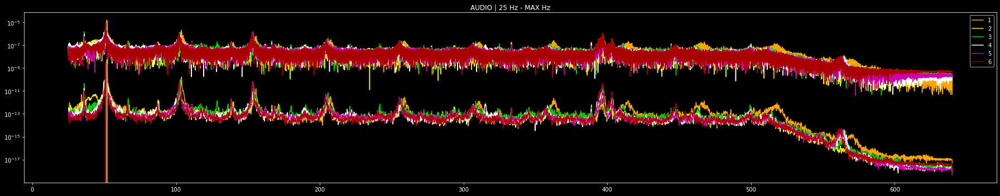

In [227]:
compose(4) # COMPLETE GRAPH

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [ 50.93750,  51.09375,  51.25000,  51.40625,  51.40625,  51.87500]


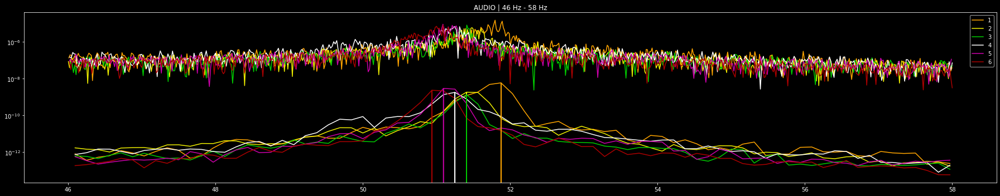

In [228]:
fc = 52
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      2   ,      3   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [102.03125, 102.18750, 102.50000, 102.65625, 102.81250, 103.75000]


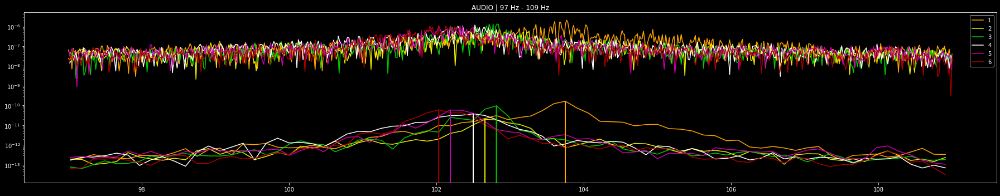

In [229]:
fc = 103
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [153.12500, 153.28125, 153.90625, 153.90625, 154.37500, 155.46875]


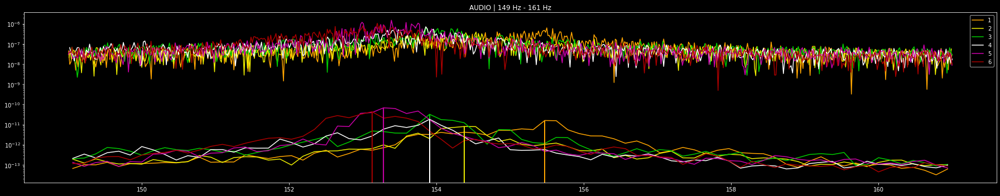

In [230]:
fc = 155
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [203.75000, 204.21875, 204.84375, 205.62500, 205.78125, 207.18750]


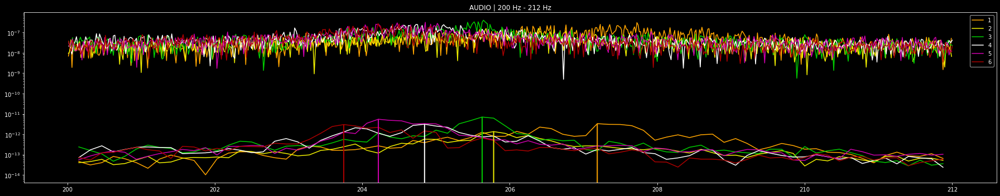

In [231]:
fc = 206
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [255.31250, 255.31250, 256.09375, 257.03125, 257.50000, 259.06250]


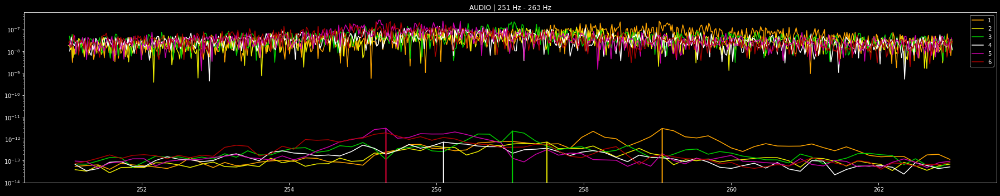

In [232]:
fc = 257
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      3   ,      2   ,      1   ,      4   ]
< > Sorted Frequencies (low to high frequencies)   - [305.78125, 307.03125, 308.43750, 308.43750, 311.25000, 315.31250]


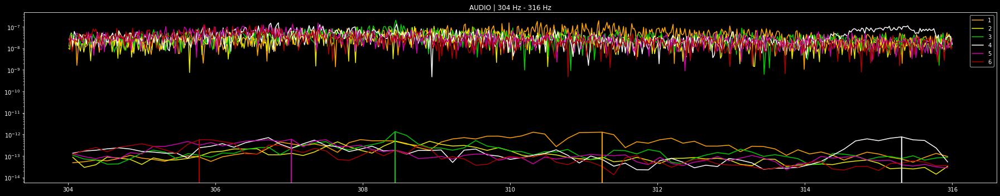

In [233]:
fc = 310
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      5   ,      4   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [356.87500, 357.50000, 358.43750, 360.00000, 360.15625, 362.81250]


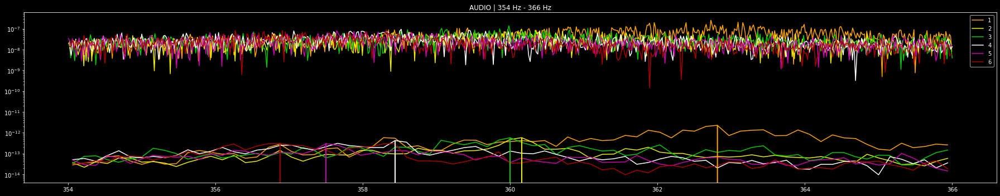

In [234]:
fc = 360
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     5   ,      6   ,      3   ,      2   ,      4   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [396.25000, 396.71875, 397.03125, 397.03125, 397.18750, 398.28125]


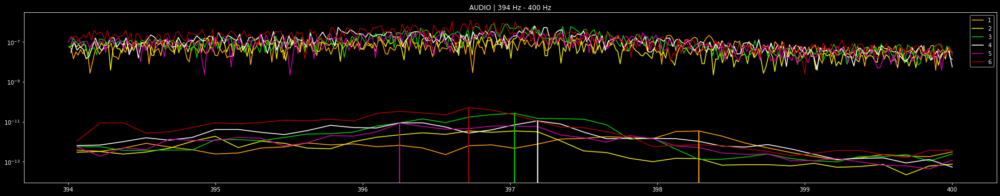

In [235]:
fc = 397
fd = 3
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      2   ,      3   ,      5   ,      1   ,      4   ]
< > Sorted Frequencies (low to high frequencies)   - [403.12500, 403.12500, 403.28125, 403.59375, 403.90625, 404.06250]


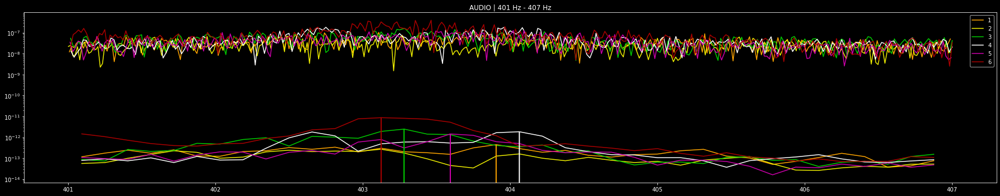

In [236]:
fc = 404
fd = 3
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     4   ,      5   ,      6   ,      3   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [407.65625, 408.28125, 409.37500, 411.40625, 412.34375, 412.96875]


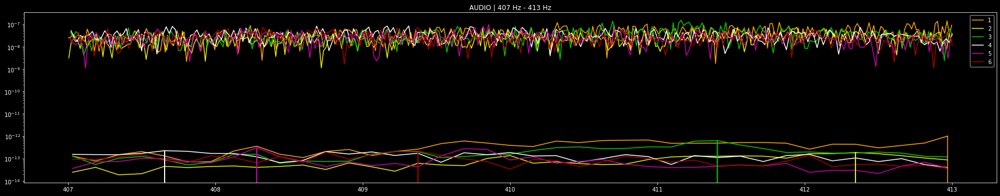

In [237]:
fc = 410
fd = 3
patterns.append(compose(4, fc - fd, fc + fd))

******************************************************** AUDIO ********************************************************
< > Sorted Frequencies (left to right compactions) - [     6   ,      3   ,      5   ,      4   ,      2   ,      1   ]
< > Sorted Frequencies (low to high frequencies)   - [498.75000, 499.37500, 499.84375, 500.00000, 500.00000, 502.03125]


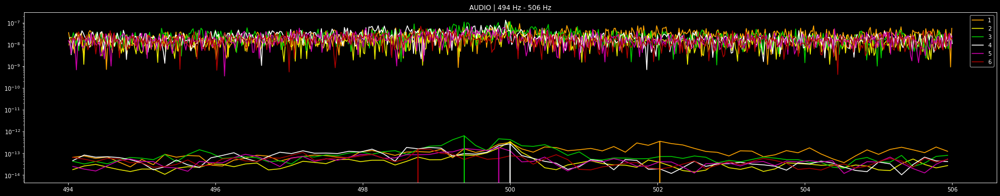

In [238]:
fc = 500
fd = 6
patterns.append(compose(4, fc - fd, fc + fd))

---

## PATTERN ANALYSIS

In [276]:
patterns_int = np.array(list(map(lambda pat:int(pat), patterns)))
patterns_str = list(map(lambda pat:str(pat), patterns_int[np.argsort(patterns_int)]))

<AxesSubplot:ylabel='count'>

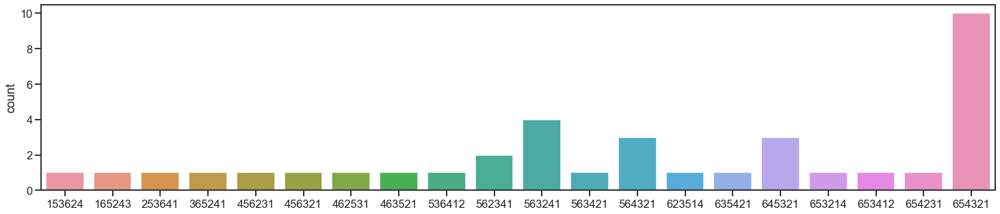

In [300]:
sns.countplot(x = patterns_str)

> `654321` is the dominant pattern, i.e. **the frequency reduces with compaction**

---